In [103]:
import pandas as pd
import torch
from transformers import BertTokenizer, BertModel
import numpy as np
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
import torch
from torch import nn
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
from tqdm import tqdm
from google.colab import files
import seaborn as sns
import torch.nn.functional as F
tqdm.pandas()
device


device(type='cuda')

In [ ]:
_ = files.upload()

Saving listings_train_reg.csv to listings_train_reg.csv


{'listings_train_reg.csv': b',listing_id,gig_id,position,created_at,is_click,context,operating_system,is_filtered,gig_price,gig_avg_rating,gig_rated_orders,imp_badge,is_seller_onlie,search_query,is_user_buyer,gig_sc_id,gig_title,cnt_helpful_reviews_last_year,avg_review_length_last_3_months,avg_position_shown_last_60d,user_timezone,user_reg_date,previous_order_sc_id,previous_order_amount,previous_order_date\n2,51e7b170c2bcdb0d7a9de207be03dd6d,7291705067010,16,2023-10-24 02:59:45.159,0,search,windows,0,115.0,4.930478818028944,1.0,no_badge,False,"textual analyst, python ",1,520.0,supply lifelike oral communication processing solution,0.0,62.0,31.24349750968456,America/New_York,2020-11-27 08:00:52.438000,97.0,50.0,2023-09-10 19:08:49.405\n8,3742a19991027c1c5d2de85077cf87f2,3991740018588,7,2023-10-25 16:25:12.983,0,search,windows,0,5.0,4.714282468875516,320.0,no_badge,False,photoshop work ,1,122.0,"make out whatever pictorial intention body of work expend adobe brick photoshop , adobe brick

In [ ]:
df = pd.read_csv("listings_train_reg.csv")
df.replace({np.nan: None}, inplace = True)

df = df[df["gig_title"].notnull()]

In [166]:
#bert_model_name = 'bert-base-uncased'
bert_model_name = 'distilbert-base-uncased'

tokenizer = BertTokenizer.from_pretrained(bert_model_name, do_lower_case = True)

tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'DistilBertTokenizer'. 
The class this function is called from is 'BertTokenizer'.


In [167]:
def split_train_validation(df, train_percent = 0.9):

    listing_df = df.groupby(["listing_id"])["created_at"].min().reset_index().sort_values(by = ["created_at"])

    train_size = int(listing_df.shape[0] * train_percent)

    train_listings_df = listing_df.iloc[0: train_size]
    validation_listings_df = listing_df.iloc[train_size:]

    train_df = pd.merge(df, train_listings_df[["listing_id"]], on = ["listing_id"])
    validation_df = pd.merge(df, validation_listings_df[["listing_id"]], on = ["listing_id"])

    return train_df, validation_df


In [168]:
train_df, validation_df = split_train_validation(df, train_percent = 0.9)

In [169]:
train_df["query_length"] = train_df["search_query"].progress_apply(lambda query: len(tokenizer(query, truncation=False)["input_ids"]))
train_df["gig_title_length"] = train_df["gig_title"].progress_apply(lambda query: len(tokenizer(query, truncation=False)["input_ids"]))

100%|██████████| 42893/42893 [00:16<00:00, 2580.73it/s]


<Axes: xlabel='query_length', ylabel='Count'>

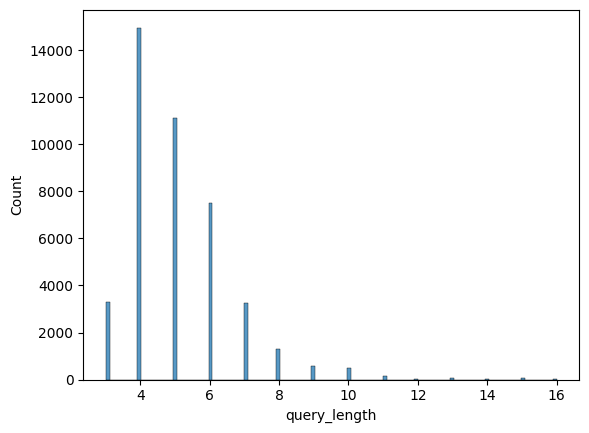

In [170]:
sns.histplot(data = train_df, x="query_length")

<Axes: xlabel='gig_title_length', ylabel='Count'>

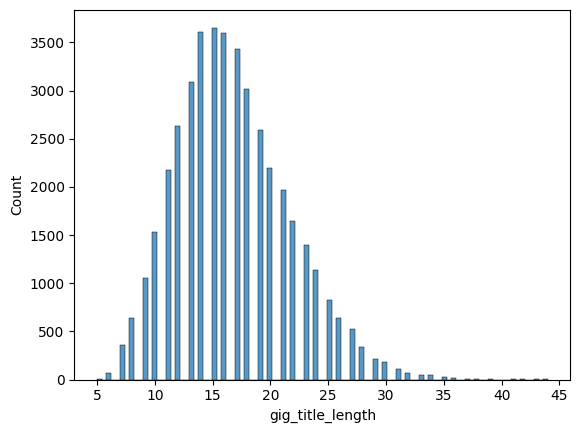

In [171]:
sns.histplot(data = train_df, x="gig_title_length")

In [174]:
class QueriesDataset(Dataset):

    def __init__(self, df, tokenizer, max_length_title = 40, max_length_query = 12):
        self._df = df
        self._tokenizer = tokenizer
        self._max_length_title = max_length_title
        self._max_length_query = max_length_query

    def __len__(self):
        return len(self._df)

    def __getitem__(self, idx):
        row = self._df.iloc[idx]
        search_query = row["search_query"]
        gig_title = row["gig_title"]
        label = row["is_click"]

        gig_title_encoding = self._tokenizer(gig_title, return_tensors='pt', max_length=self._max_length_title, padding='max_length', truncation=True, add_special_tokens=True)
        search_query_encoding = self._tokenizer(search_query, return_tensors='pt', max_length=self._max_length_query, padding='max_length', truncation=True, add_special_tokens=True)


        return search_query, gig_title, search_query_encoding, gig_title_encoding, label


(array([2.57009946e-05, 2.51004016e-04]), 9.766315261044177)

In [192]:
class BERTClassifier(nn.Module):
    def __init__(self, bert_model_name, freeze_bert = True):
        super(BERTClassifier, self).__init__()

        self.bert = BertModel.from_pretrained(bert_model_name)

        if freeze_bert:
          print("freeze_bert")
          for param in  self.bert.parameters():
            param.requires_grad = False


        self.dropout = nn.Dropout(0.3)
        self.fc1 = nn.Linear(self.bert.config.hidden_size * 2, 100)
        self.fc2 = nn.Linear(100, 1)


    def forward(self, query_input_ids, query_attention_mask, title_input_ids, title_attention_mask):
        #query_outputs = self.bert(input_ids=query_input_ids, attention_mask= query_attention_mask).pooler_output
        #title_outputs = self.bert(input_ids=title_input_ids, attention_mask=title_attention_mask).pooler_output
        #input_ids
        query_outputs  = self.bert(input_ids = query_input_ids, attention_mask=query_attention_mask, return_dict=True)["pooler_output"]
        title_outputs = self.bert(input_ids = title_input_ids, attention_mask=title_attention_mask, return_dict=True)["pooler_output"]


        embeddings = torch.cat((query_outputs, title_outputs), dim = 1)
        out =  self.fc1(embeddings)
        out = self.dropout(out)

        out = F.relu(out)

        out =  self.fc2(out)

        return out




In [184]:
target = train_df["is_click"].tolist()

class_sample_count = np.array(
    [len(np.where(target == t)[0]) for t in np.unique(target)])
weight = 1. / class_sample_count
samples_weight = np.array([weight[t] for t in target])

samples_weight = torch.from_numpy(samples_weight)
samples_weigth = samples_weight.double()
sampler = WeightedRandomSampler(samples_weight, len(samples_weight))

weight, weight[1]/weight[0]

(array([2.57009946e-05, 2.51004016e-04]), 9.766315261044177)

In [ ]:
target = train_df["is_click"].tolist()

class_sample_count = np.array(
    [len(np.where(target == t)[0]) for t in np.unique(target)])
weight = 1. / class_sample_count
samples_weight = np.array([weight[t] for t in target])

samples_weight = torch.from_numpy(samples_weight)
samples_weigth = samples_weight.double()
sampler = WeightedRandomSampler(samples_weight, len(samples_weight))

weight, weight[1]/weight[0]


In [ ]:
batch_size = 64

In [199]:
validation_dataset = QueriesDataset(validation_df, tokenizer)
validation_dataloader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)


train_eval_dataset = QueriesDataset(train_df, tokenizer)
train_eval_dataloader = DataLoader(train_eval_dataset, batch_size=batch_size, shuffle=False)


train_dataset = QueriesDataset(train_df, tokenizer)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, sampler = sampler)


In [195]:

model = BERTClassifier(bert_model_name, freeze_bert = False).to(device)

#optimizer = torch.optim.SGD(params=model.parameters(),  lr=0.01)

#optimizer = torch.optim.Adam(model.parameters(), lr= 0.0001)
optimizer = torch.optim.AdamW(model.parameters(), lr = 0.00001)
criterion = nn.BCEWithLogitsLoss().to(device)


You are using a model of type distilbert to instantiate a model of type bert. This is not supported for all configurations of models and can yield errors.
Some weights of BertModel were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['encoder.layer.11.attention.output.LayerNorm.weight', 'encoder.layer.9.intermediate.dense.bias', 'encoder.layer.8.attention.self.value.bias', 'encoder.layer.9.attention.self.value.weight', 'encoder.layer.10.attention.self.value.bias', 'encoder.layer.0.attention.output.LayerNorm.weight', 'encoder.layer.5.attention.output.dense.bias', 'encoder.layer.8.attention.output.LayerNorm.bias', 'encoder.layer.10.intermediate.dense.bias', 'encoder.layer.6.attention.output.dense.weight', 'encoder.layer.6.attention.self.key.bias', 'encoder.layer.3.output.dense.bias', 'encoder.layer.2.output.LayerNorm.weight', 'encoder.layer.11.attention.self.key.weight', 'encoder.layer.11.intermediate.dense.weight', 'encoder.layer.8.output

In [200]:
def eval_model(data_loader, model):
  model.eval()

  total_loss = 0.
  size = 0.
  with torch.no_grad():

    for (search_query, gig_title, search_query_encoding, gig_title_encoding, label) in tqdm(data_loader, total = len(data_loader)):

      label = label.float().reshape(-1, 1).to(device)

      query_input_ids = search_query_encoding["input_ids"].to(device).squeeze(1)
      query_attention_mask = search_query_encoding["attention_mask"].to(device).squeeze(1)

      title_input_ids = gig_title_encoding["input_ids"].to(device).squeeze(1)
      title_attention_mask = gig_title_encoding["attention_mask"].to(device)

      res = model(query_input_ids, query_attention_mask, title_input_ids, title_attention_mask)

      loss = criterion(res, label)
      size += label.shape[0]

      total_loss += loss.detach().cpu().item()

  return total_loss/size




In [ ]:
for epoc in range(100):

    batch_loss = 0.

    model.train()
    c = 0.
    for (_, _ , search_query_encoding, gig_title_encoding, label) in tqdm(train_dataloader, total = len(train_dataloader)):

        optimizer.zero_grad()


        label = label.float().reshape(-1, 1).to(device)
        c += label.shape[0]
        query_input_ids = search_query_encoding["input_ids"].to(device).squeeze(1)
        query_attention_mask = search_query_encoding["attention_mask"].to(device).squeeze(1)

        title_input_ids = gig_title_encoding["input_ids"].to(device).squeeze(1)
        title_attention_mask = gig_title_encoding["attention_mask"].to(device).squeeze(1)

        res = model(query_input_ids, query_attention_mask, title_input_ids, title_attention_mask)

        loss = criterion(res, label)
        loss.backward()
        optimizer.step()
        batch_loss += loss.detach().cpu().item()


    validation_loss = eval_model(validation_dataloader, model)
    train_loss = eval_model(train_eval_dataloader, model)

    print(f"train_loss - {train_loss} validation loss {validation_loss}")


 49%|████▉     | 329/671 [00:33<00:34,  9.79it/s]

In [186]:
def predict(data_loader, model):

  model.eval()

  rows = []
  with torch.no_grad():

    for (search_query, gig_title, search_query_encoding, gig_title_encoding, label) in tqdm(data_loader, total = len(data_loader)):

      query_input_ids = search_query_encoding["input_ids"].to(device).squeeze(1)
      query_attention_mask = search_query_encoding["attention_mask"].to(device).squeeze(1)

      title_input_ids = gig_title_encoding["input_ids"].to(device).squeeze(1)
      title_attention_mask = gig_title_encoding["attention_mask"].to(device)

      res = model(query_input_ids, query_attention_mask, title_input_ids, title_attention_mask)

      res = torch.sigmoid(res)
      res = res.flatten()

      r = [(q, t, s, l.item()) for (q, t, s, l) in zip(search_query, gig_title, res.flatten().detach().cpu().numpy(), label.flatten())]

      rows.extend(r)

    return pd.DataFrame(rows, columns = ["query", "title","score","label"])



In [188]:
train_preds_df = predict(train_dataloader, model)
train_preds_df.sample(4)

100%|██████████| 671/671 [01:09<00:00,  9.67it/s]


,query,title,score,label
42718,cartoon,hook with cartoon artistic creation vogue repr...,0.652664,1
5264,onpage optimization,execute shape wordpress optimise yoast with on...,0.229371,0
40454,local seo,"behave 80,000 Google function Citation for gmb...",0.121652,0
19594,construction render,"fare national invention , power interior decor...",0.737793,1


In [189]:
validation_preds_df = predict(validation_dataloader, model)
validation_preds_df.sample(4)

100%|██████████| 76/76 [00:07<00:00,  9.66it/s]


,query,title,score,label
559,thumbnail,innovation the everlasting youtube thumbnail,0.184473,0
1150,pre-recored Meditation,phonograph record pass speculation operating r...,0.512519,0
308,clothing graphic design,draw pictorial MT shirt intent operating theat...,0.071337,0
3977,backdrop design step and repeat fast turnaround,"intent amp neat background , stair and repetit...",0.642389,0


<Axes: xlabel='score', ylabel='Count'>

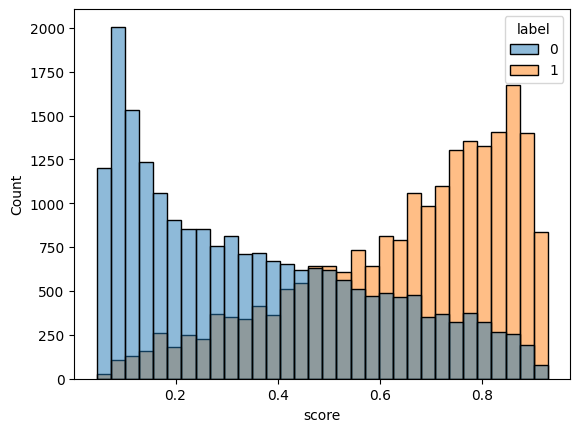

In [182]:
import seaborn as sns
sns.histplot(data = train_preds_df, x="score", hue = "label")

<Axes: xlabel='score', ylabel='Count'>

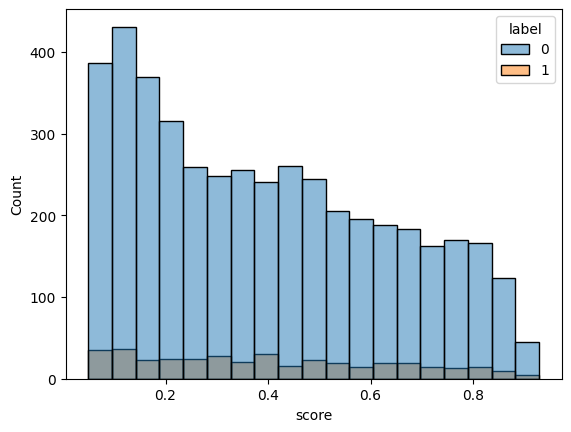

In [190]:
import seaborn as sns
sns.histplot(data = validation_preds_df, x="score", hue = "label")